# The 2015 Calibration Observation Compared to Raul's Coefficients

In this notebook, we try to match Raul's calibration coefficients as closely as possible with `edges_cal`. We show the differences between the two calibrations, and the effect this has on sky data.

There is a companion notebook that does almost exactly the same thing but compares to Alan's calibration.

## Imports and Setup

In [1]:
from edges_cal import CalibrationObservation
import numpy as np
from scipy.interpolate import InterpolatedUnivariateSpline as spline
import matplotlib.pyplot as plt
from edges_analysis.analysis.calibrate import LabCalibration
from pathlib import Path
from edges_cal import modelling as mdl
from edges_cal import receiver_calibration_func as rcf
from edges_estimate.likelihoods import LinearFG
from edges_estimate.eor_models import AbsorptionProfile
from edges_estimate.fitting import SemiLinearFit
from yabf.core.samplers import run_map
import edges_cal as ec
import edges_analysis as ea
import edges_io as eio

%matplotlib inline

In [2]:
# Setup plotting for MNRAS
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['figure.dpi'] = 600

single_width = 3.377  # inches
double_width = 7.03   # inches

In [3]:
print(f"Using edges-io v{eio.__version__}")
print(f"Using edges-cal v{ec.__version__}")
print(f"Using edges-analysis v{ea.__version__}")

Using edges-io v3.1.0
Using edges-cal v5.1.1
Using edges-analysis v2.1.1


**NOTE:** In `v5.2.0` of `edges-cal`, a bug was found (and fixed) in which the LNA S11 was using the wrong units for frequency. This notebook does *not* use this fix. The reason is that the final output of the notebook (a calfile) was used in several analyses of field data, and we wish to preserve the exact form of that output. 

## Definition of Calibration Observation

The parameters for this calibration observation were set by email exchange with Raul, and should represent the same set of parameters/data used by him to do his calibration. We also create a `LabCalibration` object, which adds antenna S11 to the receiver calibration. 

The files used here are on the `enterprise` cluster. Note that the final `Calibration` file that is written out (to be used elsewhere in the reproduction of the Nature Paper results) is *not* exactly this observation (see below).

In [31]:
calobs = CalibrationObservation(
    "/data5/edges/data/CalibrationObservations/Receiver01/Receiver01_25C_2015_09_02_040_to_200MHz/", 
    f_low=50.0,
    f_high=100.0,
    run_num={"receiver_reading": 6},
    repeat_num=1,
    cterms=6,
    wterms=5,
    load_kwargs= {"t_load": 300, "t_load_ns": 350},
    load_spectra = {
        "hot_load": {"ignore_times_percent": 10},
        "ambient": {"ignore_times_percent": 7},
        "open": {"ignore_times_percent": 7},
        "short": {"ignore_times_percent": 7},
    },
    load_s11s = {"lna":{'n_terms': 11, 'model_type': 'polynomial'}}
)

def get_labcal(calobs):
    s11_files = sorted(Path('/data5/edges/data/S11_antenna/low_band/20151207').glob('run_0001_*20151208_0314*.s1p'))
    return LabCalibration(
        calobs=calobs, s11_files=s11_files, ant_s11_model=mdl.Polynomial(n_terms=10, transform=mdl.LogTransform(scale=75.0))
    )


labcal = get_labcal(calobs)
f = calobs.freq.freq

## Data Reading

In this notebook, we compare our calibration observation with data directly provided by Raul. Here we read in those data files.

In [5]:
# Note that specal_final_case2.txt is equivalent to specal.txt
cal_params = np.genfromtxt("raul-data/for_steven_low_band_1_extended_GP_calibration_parameters.txt")
raul_lna = cal_params[:, 1] + 1j*cal_params[:, 2]

In [6]:
raul_s11_cal = np.genfromtxt(
    "raul-data/raul_all_s11_calibrated.txt",
    dtype = [
        ('freq', float),
        ('lna_re', float),
        ('lna_im', float),
        ('ambient_re', float),
        ('ambient_im', float),
        ('hot_load_re', float),
        ('hot_load_im', float),
        ('open_re', float),
        ('open_im', float),
        ('short_re', float),
        ('short_im', float),
        ('semi_rigid_s11_re', float),
        ('semi_rigid_s11_im', float),
        ('semi_rigid_s12_re', float),
        ('semi_rigid_s12_im', float),
        ('semi_rigid_s22_re', float),
        ('semi_rigid_s22_im', float),
        ('antsim1_re', float),
        ('antsim1_im', float),
        ('antsim2_re', float),
        ('antims2_im', float),
    ]
)

In [7]:
alan_sky_data = np.genfromtxt("alans-data/spe0.txt")
flg = alan_sky_data[:, 12]>0
alan_sky_data = {
    'freq': alan_sky_data[:, 1][flg],
    't_ant': alan_sky_data[:, 3][flg],
    't_sky': alan_sky_data[:, 6][flg],
}

In [37]:
loss = 1  #spline(f, cal_params[:, -1] * cal_params[:, -2] * cal_params[:, -3])(alan_sky_data['freq'])
bmcorr = 1
loss_temp = 0

## Compare Receiver Properties

### Receiver S11

First, let's compare the measured and calibrated LNA S11 between the edges-cal observation and Alan's code. To make sure we haven't just used a different run number, we also plot all of the run numbers.

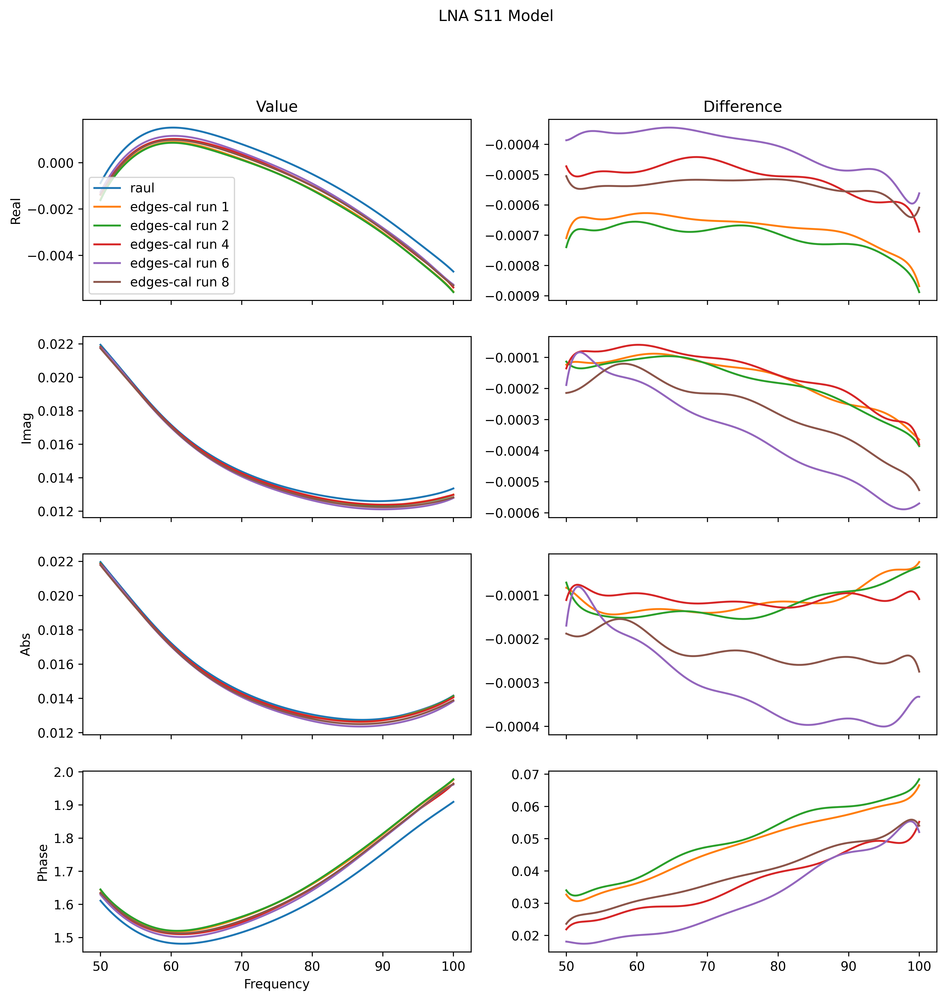

In [8]:
fig, ax = plt.subplots(4, 2, sharex=True, figsize=(12,12))

f = calobs.freq.freq

ax[0,0].plot(f, np.real(raul_lna), label='raul')
ax[1,0].plot(f, np.imag(raul_lna))
ax[2,0].plot(f, np.abs(raul_lna))
ax[3,0].plot(f, np.angle(raul_lna))

ax[1,0].set_ylabel("Imag")
ax[3,0].set_xlabel("Frequency")
ax[0,0].set_ylabel('Real')
ax[2,0].set_ylabel("Abs")
ax[3,0].set_ylabel("Phase")

for i, run_num in enumerate([1,2,4,6,8]):
    clb = calobs.clone(run_num={"receiver_reading": run_num})

    ax[0,0].plot(f, np.real(clb.lna.s11_model(f)), label='edges-cal run %s'%run_num)
    ax[1,0].plot(f, np.imag(clb.lna.s11_model(f)))
    ax[2,0].plot(f, np.abs(clb.lna.s11_model(f)))
    ax[3,0].plot(f, np.angle(clb.lna.s11_model(f)))
    
    ax[0,1].plot(f, np.real(clb.lna.s11_model(f)) - np.real(raul_lna), color=f'C{i+1}')
    ax[1,1].plot(f, np.imag(clb.lna.s11_model(f)) - np.imag(raul_lna), color=f'C{i+1}')
    ax[2,1].plot(f, np.abs(clb.lna.s11_model(f)) - np.abs(raul_lna), color=f'C{i+1}')
    ax[3,1].plot(f, np.angle(clb.lna.s11_model(f)) - np.angle(raul_lna), color=f'C{i+1}')
    
fig.suptitle("LNA S11 Model")
ax[0,0].set_title("Value")
ax[0,1].set_title("Difference")

ax[0, 0].legend();

Note that there are definitely differences in the Receiver S11 here. They are minimized when using `run_num=6`, which is nominally the file that was used by Raul. The offset is systematic.

### Antenna S11

We also compare the Antenna S11 here, not because it affects the receiver calibration, but because need it to check the effect of the receiver calibration on the final sky data.

In [44]:
raul_ant_s11_rl = spline(f, cal_params[:, 8])
raul_ant_s11_im = spline(f, cal_params[:, 9])
raul_ant_s11 = raul_ant_s11_rl(f) + 1j*raul_ant_s11_im(f)

def raul_ant_s11_func(freq):
    return raul_ant_s11_rl(freq) + 1j*raul_ant_s11_im(freq)

Text(0.5, 1.0, 'Antenna S11')

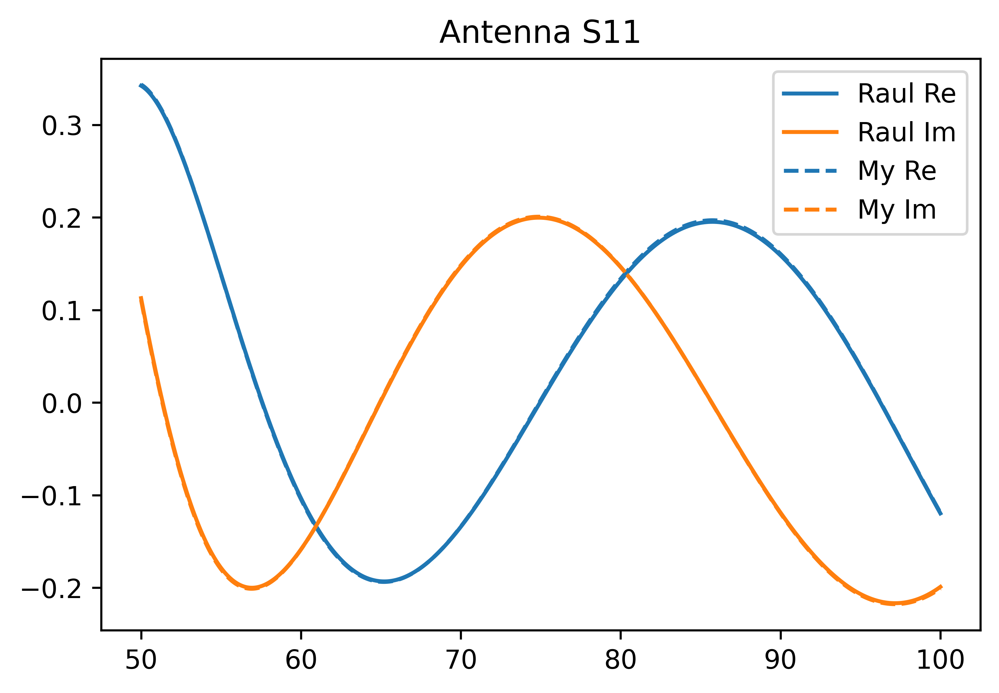

In [10]:
plt.plot(f, np.real(raul_ant_s11), color='C0', label='Raul Re')
plt.plot(f, np.imag(raul_ant_s11), color='C1', label='Raul Im')
plt.plot(f, np.real(labcal.antenna_s11_model(f)), ls='--', color='C0', label='My Re')
plt.plot(f, np.imag(labcal.antenna_s11_model(f)), ls='--', color='C1', label='My Im')
plt.legend()
plt.title("Antenna S11")

Text(0.5, 1.0, 'Antenna S11 Phase')

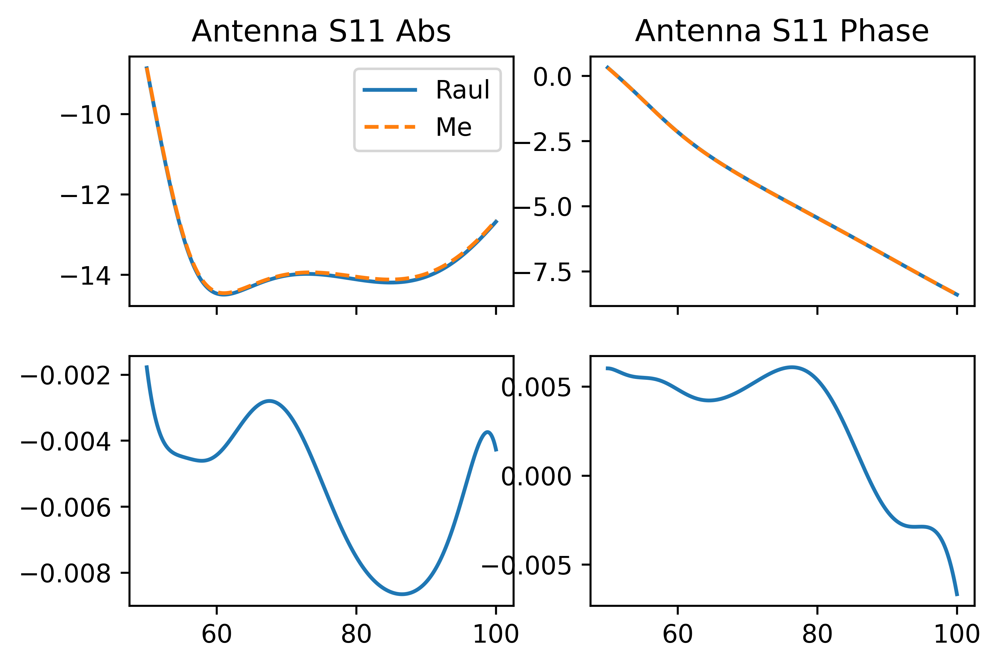

In [11]:
fig, ax = plt.subplots(2, 2, sharex=True)

ax[0, 0].plot(f, 20*np.log10(np.abs(raul_ant_s11)),  label='Raul')
ax[0, 1].plot(f, np.unwrap(np.angle(raul_ant_s11)), )

ax[1, 0].plot(f, np.abs(raul_ant_s11)/np.abs(labcal.antenna_s11_model(f)) - 1)

ax[0, 0].plot(f, 20*np.log10(np.abs(labcal.antenna_s11_model(f))), ls='--',  label='Me')
ax[0, 1].plot(f, np.unwrap(np.angle(labcal.antenna_s11_model(f))), ls='--', )
ax[1, 1].plot(f, np.unwrap(np.angle(raul_ant_s11)) - np.unwrap(np.angle(labcal.antenna_s11_model(f))))

ax[0, 0].legend()
ax[0, 0].set_title("Antenna S11 Abs")
ax[0, 1].set_title("Antenna S11 Phase")

## Compare Calibration Solutions on Sky Data

In [38]:
def decalibrate(t_sky, f_sky, labcal=None):
    if labcal is None:
        ra, rb = rcf.get_linear_coefficients(
            gamma_ant = raul_ant_s11,
            gamma_rec = raul_lna,
            sca = cal_params[:, 3],
            off = cal_params[:, 4],
            t_unc = cal_params[:, 5],
            t_cos = cal_params[:, 6],
            t_sin = cal_params[:, 7],
            t_load=300
        ) 
        tload = 300
        tloadns = 350
    else:
        ra, rb = labcal.get_linear_coefficients()
        tload = labcal.calobs.t_load
        tloadns = labcal.calobs.t_load_ns
        
    ra = spline(f, ra)(f_sky)
    rb = spline(f, rb)(f_sky)
    
    return ((loss/bmcorr)*t_sky + loss_temp - rb - ra*tload)/(tloadns*ra), ra, rb

def recalibrate(labcal, t_sky, f_sky, with_same=False):
    q, ra, rb = decalibrate(t_sky, f_sky, labcal=labcal if with_same else None)

    if with_same:
        a, b = ra, rb
    else:
        a, b = labcal.get_linear_coefficients()
        a = spline(f, a)(f_sky)
        b = spline(f, b)(f_sky)
    new_t = (labcal.calobs.t_load_ns*a*q + a*labcal.calobs.t_load + b - loss_temp)*bmcorr/loss
    return new_t

def plot_coefficient_comparison(labcals, with_total_effects=True, t_sky=None, f_sky=None):

    c1, c2, tu, tc, ts = cal_params[:, 3:8].T
    
    fig, ax = plt.subplots(6 if with_total_effects else 5, 4 if with_total_effects else 2, sharex=True, figsize=(single_width*5, 10)) 
    ax[0, 0].plot(f, c1, label='alan', color='k')
    ax[1, 0].plot(f, c2, color='k')
    ax[2, 0].plot(f, tu, color='k')
    ax[3, 0].plot(f, tc, color='k')
    ax[4, 0].plot(f, ts, color='k')
    
    for j, (name, labcal) in enumerate(labcals.items()):
        calobs=labcal.calobs
        ls=['-','--','-.',':'][j%4]
        
        ax[0, 0].plot(calobs.freq.freq, calobs.C1(), label=name, ls=ls)    
        ax[0, 1].plot(calobs.freq.freq, calobs.C1()/c1 -1, ls=ls)
        ax[0, 0].set_ylabel("C1")

        ax[1, 0].plot(calobs.freq.freq, calobs.C2(), ls=ls)
        ax[1, 1].plot(calobs.freq.freq, calobs.C2()/c2 -1, ls=ls)
        ax[1, 0].set_ylabel("C2")

        ax[2, 0].plot(calobs.freq.freq, calobs.Tunc(), ls=ls)
        ax[2, 1].plot(calobs.freq.freq, calobs.Tunc()/tu -1, ls=ls)
        ax[2, 0].set_ylabel("Tunc")

        ax[3, 0].plot(calobs.freq.freq, calobs.Tcos(), ls=ls)
        ax[3, 1].plot(calobs.freq.freq, calobs.Tcos()/tc -1, ls=ls)
        ax[3, 0].set_ylabel("Tcos")

        ax[4, 0].plot(calobs.freq.freq, calobs.Tsin(), ls=ls)
        ax[4, 1].plot(calobs.freq.freq, calobs.Tsin()/ts -1, ls=ls)
        ax[4, 0].set_ylabel("Tsin")

        if with_total_effects:
            antsim = calobs.new_load('AntSim1', reflection_kwargs={"n_terms": 105})
            
            for i, (src_name, source) in enumerate(list(calobs._loads.items()) + [('antsim', antsim)]):
                a, b = calobs.get_linear_coefficients(load=source)

                ra, rb = rcf.get_linear_coefficients(
                    gamma_ant = source.s11_model(calobs.freq.freq),
                    gamma_rec = raul_lna,
                    sca = c1,
                    off = c2,
                    t_unc = tu,
                    t_cos = tc,
                    t_sin = ts,
                    t_load=300
                )
                
                ax[i, 2].plot(calobs.freq.freq, source.spectrum.averaged_spectrum*a + b, ls=ls)
                ax[i, 3].plot(calobs.freq.freq, source.spectrum.averaged_spectrum*(a-ra) + (b-rb), ls=ls)
                ax[i, 2].set_ylabel(f"Cal. {src_name}")
            
            ra, rb = rcf.get_linear_coefficients(
                gamma_ant = raul_ant_s11,
                gamma_rec = raul_lna,
                sca = c1,
                off = c2,
                t_unc = tu,
                t_cos = tc,
                t_sin = ts,
                t_load=300
            ) 
            ra = spline(calobs.freq.freq, ra)(f_sky)
            rb = spline(calobs.freq.freq, rb)(f_sky)
                       
            a, b = labcal.get_linear_coefficients(freq=calobs.freq.freq)
            
            a = spline(calobs.freq.freq, a)(f_sky)
            b = spline(calobs.freq.freq, b)(f_sky)
            
            
            ax[5, 2].plot(f_sky, (t_sky-b)/a, ls=ls)
            ax[5, 3].plot(f_sky, t_sky- recalibrate(labcal,t_sky, f_sky), ls=ls)
            ax[5, 2].set_ylabel("Uncal. Field Data")


    
    ax[0,0].set_title("Noise Waves")
    ax[0,1].set_title("Frac. Deviation")
    ax[0,2].set_title("Cal. Spectra")
    ax[0,3].set_title("Frac. Deviation")
    
    
    
    if with_total_effects:
        ax[5, 2].plot(f_sky, (t_sky-rb)/ra)
        
    for i in range(4):
        ax[-1, i].set_xlabel("Freq")
    ax[0, 0].legend()
    plt.tight_layout()

In [39]:
plot_coefficient_comparison({"edges-cal": labcal}, t_sky=alan_sky_data['t_ant'], f_sky=alan_sky_data['freq'])

## Injection of Different Quantities

To try and sort out where the main differences come from, we inject Alan's values for different properties into the calibration observation, using them to derived the final calibration coefficients and/or antenna calibration.

In [45]:
plot_coefficient_comparison(
    {"default": labcal, 
     "Match LNA": get_labcal(calobs.inject(lna_s11=raul_lna)),
     "Match NoiseWaves": get_labcal(
         calobs.inject(
            c1 = cal_params[:, 3],
            c2 = cal_params[:, 4],
            t_unc = cal_params[:, 5],
            t_cos = cal_params[:, 6],
            t_sin = cal_params[:, 7],
        )
     ),
     "Match AntS11": labcal.with_ant_s11(raul_ant_s11_func),
    }, 
    t_sky=alan_sky_data['t_ant'],
    f_sky=alan_sky_data['freq'],
);

Here we see that fixing the LNA S11 resolves the biggest differences in the noise-waves (second colum, lower 4 panels). We also see that matching the AntS11 has the biggest impact on reducing the difference in the final calibrated sky temperature (bottom right). However, there's not one aspect that has an exceedingly dominant effect: all have to be set right to get the same answer.

## Summary Differences in Field Data

Let's try to summarize the gross differences induced by our calibration observation. We again inject different properties directly from Alan's results.

### Differences in Calibrated Sky Temperature

In [46]:
recal_tsky = recalibrate(labcal, alan_sky_data['t_ant'], alan_sky_data['freq'])

In [51]:
calobs_nw = calobs.inject(
    c1 = cal_params[:, 3],
    c2 = cal_params[:, 4],
    t_unc = cal_params[:, 5],
    t_cos = cal_params[:, 6],
    t_sin = cal_params[:, 7],
)
calobs_nw_lna = calobs.inject(
    c1 = cal_params[:, 3],
    c2 = cal_params[:, 4],
    t_unc = cal_params[:, 5],
    t_cos = cal_params[:, 6],
    t_sin = cal_params[:, 7],
    lna_s11=raul_lna
)

labcal_nw = get_labcal(calobs_nw)
labcal_nw_lna = get_labcal(calobs_nw_lna)
labcal_nw_lna_ant = labcal_nw_lna.with_ant_s11(raul_ant_s11_func)
labcal_s11 = labcal.with_ant_s11(raul_ant_s11_func)
labcal_nw_s11 = labcal_nw.with_ant_s11(raul_ant_s11_func)

recal_tsky_injected = recalibrate(labcal_nw,  alan_sky_data['t_ant'], alan_sky_data['freq'])
recal_tsky_inj_s11 = recalibrate(labcal_nw_s11,  alan_sky_data['t_ant'], alan_sky_data['freq'])
recal_tsky_s11 = recalibrate(labcal_s11,  alan_sky_data['t_ant'], alan_sky_data['freq'])
recal_tsky_all = recalibrate(labcal_nw_lna_ant,  alan_sky_data['t_ant'], alan_sky_data['freq'])
recal_tsky_lna = recalibrate(labcal_nw_lna, alan_sky_data['t_ant'], alan_sky_data['freq'])

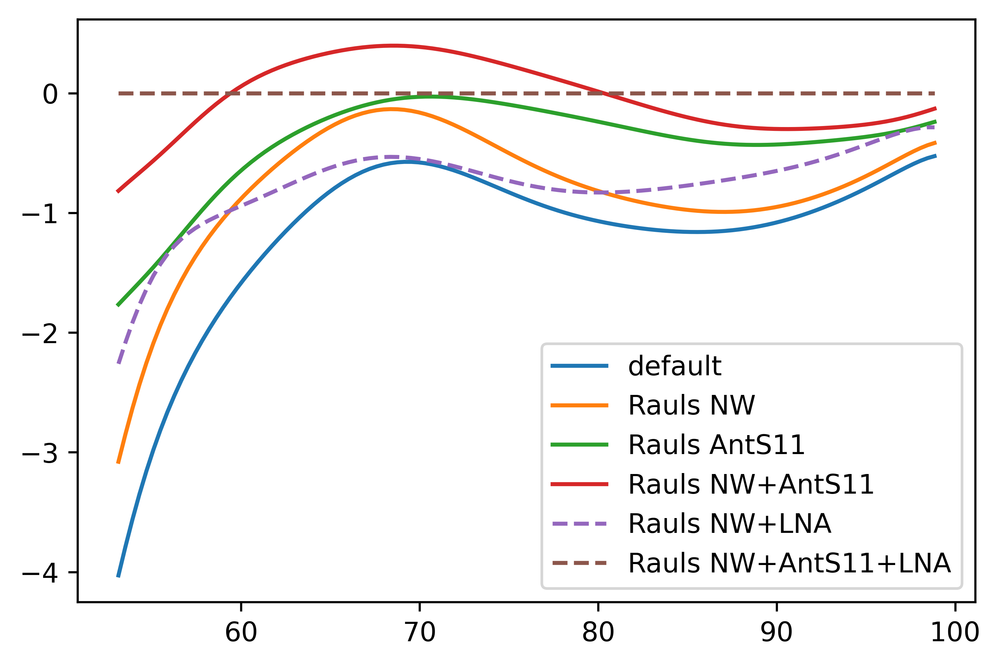

In [52]:
plt.plot(alan_sky_data['freq'], alan_sky_data['t_ant'] - recal_tsky, label='default')
plt.plot(alan_sky_data['freq'], alan_sky_data['t_ant'] - recal_tsky_injected, label='Rauls NW')
plt.plot(alan_sky_data['freq'], alan_sky_data['t_ant'] - recal_tsky_s11, label='Rauls AntS11')
plt.plot(alan_sky_data['freq'], alan_sky_data['t_ant'] - recal_tsky_inj_s11, label='Rauls NW+AntS11')
plt.plot(alan_sky_data['freq'], alan_sky_data['t_ant'] - recal_tsky_lna, label='Rauls NW+LNA', ls='--')
plt.plot(alan_sky_data['freq'], alan_sky_data['t_ant'] - recal_tsky_all, label='Rauls NW+AntS11+LNA', ls='--')

plt.legend()

This is just a close-up of the bottom-right panel in the previous figure, where we add a few more cases. One thing to note is that if we really do use the NW, AntS11 and LNA directly from Raul, we compute exactly the same calibrated spectrum. Another thing is that getting any one of these wrong adds at least ~1K max residual. There is no one thing that dominates the error. 

### Differences in Foreground Residuals

Even though there are differences, do they really affect final estimates of the absorption feature? Maybe they would be picked up by the LinLog?

In [53]:
def make_absorption(freq, fix=tuple()):
    params={
        'A': {'max':2, 'min': 0.05, 'fiducial': 0.5}, 
        'nu0': {'min': 60, 'max': 90, 'fiducial': 78.5}, 
        'tau': {'min': 1, 'max': 20, 'fiducial': 7}, 
        'w': {'min':1, 'max': 25, 'fiducial': 15}
    }
    
    fid = {}
    for p in fix:
        fid[p] = params.pop(p)['fiducial']
        
    return AbsorptionProfile(
        name='absorption',
        fiducial=fid,
        params=params,
        freqs=freq
    )

In [54]:
linlog5 = mdl.LinLog(n_terms=5)

In [55]:
lfg = LinearFG(
    freq=alan_sky_data['freq'],
    t_sky=recal_tsky,
    var=0.009*np.ones_like(alan_sky_data['freq']),
    fg=linlog5,
    eor=make_absorption(alan_sky_data['freq'], fix=('tau',))
)
res_lfg = run_map(lfg.partial_linear_model)

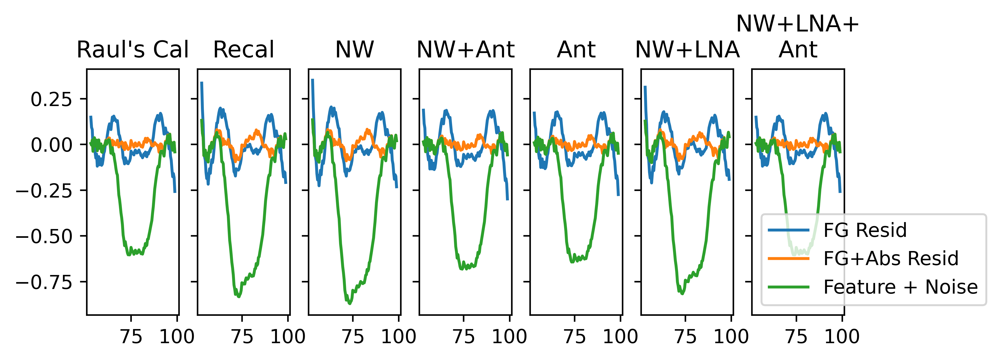

In [56]:
fig, ax = plt.subplots(1, 7, sharey=True, figsize=(double_width, double_width/3))

ff = alan_sky_data['freq']

for i, spec in enumerate([alan_sky_data['t_ant'], recal_tsky, recal_tsky_injected, recal_tsky_inj_s11,recal_tsky_s11, recal_tsky_lna, recal_tsky_all]):
    slf = SemiLinearFit(
        fg=linlog5.at(x=alan_sky_data['freq']), 
        eor=make_absorption(alan_sky_data['freq'], fix=('tau',)), 
        spectrum=spec, 
        sigma=0.03
    )
    res = slf()
    
    ax[i].plot(ff, slf.get_resid([0, 75, 20]), label="FG Resid")
    ax[i].plot(ff, slf.get_resid(res.x), label="FG+Abs Resid")
    ax[i].plot(ff, slf.get_eor(res.x) + slf.get_resid(res.x), label="Feature + Noise")
    
    if i==6:
        ax[i].legend()
    
    ax[i].set_title(
        [
            "Raul's Cal",
            "Recal",
            "NW",
            "NW+Ant",
            "Ant",
            "NW+LNA",
            "NW+LNA+\nAnt"
        ][i]
    )
    

The big thing to notice here is that almost all of the difference in the final feature estimate comes from the Antenna S11 -- differences in the NW and LNA seem to be smooth/small enough to not effect the result. Getting the NW right without the Antenna S11 actually makes the feature estimation *more* different!

## Write out the Calibration observation

Since there is some difference induced by using Alan's noise waves, we write out the calfile using the *injected noise waves from Alan*. This allows us to use edges-analysis to continue calibrating and analysing data, but with the exact same parameters as Alan.

In [58]:
calobs_nw.write("rauls_noise_waves_injected-nw_2015.h5")
calobs_nw_lna.write('rauls_noise_waves_injected-nw+lna_2015.h5')
calobs.write("raul_noise_waves_2015.h5")